<a href="https://colab.research.google.com/github/Regis0323/Module_1/blob/main/Module_1_Session_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="background-color: #004B87; padding: 20px; border-radius: 10px;">
    <img src="https://cdn-assets-us.frontify.com/s3/frontify-enterprise-files-us/eyJwYXRoIjoibWlsbGltYW5cL2ZpbGVcL2l3dHhYOHJqV3pVUUV0R3hLc0FGLnN2ZyJ9:milliman:1F1qJpvDxGMTndryYS7nEiCYPRFCCi7l2rEhgnpdkGo?width=2400" width="300" height="150" alt="SVG Image" />
    <center>
        <h1 style="color:#FFFFFF;">IABE Data Science Certificate - Module 1 - Session 6</h1>
    </center>
    <center>
        <h2 style="color:#FFFFFF;">Programming: Regularization Ridge, Lasso, ElasticNet and link with Support Vector Machines</h2>
    </center>
    <center>
        <h2 style="color:#FFFFFF;">December 12, 2024</h2>
    </center>
    <center>
        <p style="color:#FFFFFF;"></p>
    </center>
</div>

# 1. Introduction<a name="Introduction"></a>
  
Welcome to the sixth programming session of the Actuarial Data Scientist training program. This class continues a series of twelve practical sessions divided in three main modules. These presentations aim to concretely illustrate how a variety of data science techniques can be applied in an actuarial context.
<br />
<br />
This session will primarly focus on Regularization, the subject of the past theoretical session. Different regularization techniques will have been introduced in the theoretical session. In the practical session we will focus on how to use these techniques in Python.

To have to focus on the implementation in python during this session, an open-source dataset build into scikit-learn is used.

## Overview
1. [Introduction](#Introduction)<br />
2. [Importing and cleaning data](#Importing_and_cleaning_data)<br />
3. [Data feature engineering and Visualization](#Data_feature_engineering_and_visualization)<br />
4. [Modelling](#Modelling)<br />
4.1. [Data prep](#Data_prep)<br />
4.2. [Ridge Regression](#Ridge)<br />
4.3. [Lasso Regression](#Lasso)<br />
4.4. [ElasticNet Regression](#ElasticNet)<br />
4.5. [Support Vector Machines](#SVM)<br />
4.5. [Model Comparison and Visaulizations](#Model_comparison)<br />
5. [Conclusion](#Conclusion)<br />

## Speakers

**Raymond van Es**
<br />
Raymond is a Principal with 20+ years of experience in the industry.
<br />
Mail address: Raymond.vanes@milliman.com


**Daniël Van Dam**
<br />
Daniël is a consultant with 9+ years of experience in the financial sector, with experience in AI and data science.
<br />
Mail address: daniel.vandam@milliman.com


## Resources
**Dataset**
1. [California housing](https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html)<br />Pace, R. Kelley and Ronald Barry, Sparse Spatial Autoregressions, Statistics and Probability Letters, 33 (1997) 291-297

## Importing packages <a name="Importing_packages"></a>

In [ ]:
# Import necessary libraries for data manipulation
import pandas as pd
import numpy as np

In [ ]:
# Import necessary libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
# Importing machine learning and data libraries from scikit-learn
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.svm import SVR

In [ ]:
# Importing libraries from scikit-Learn for model evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFE
from sklearn.linear_model import lasso_path, enet_path

# 2. Importing and cleaning data <a name="Importing_and_cleaning_data"></a>

**California Housing dataset Description**


Data Set Characteristics:
- Number of Instances: 20640
- Number of Attributes: 8 numeric, predictive attributes and the target


Attribute Information:
- MedInc        median income in block group
- HouseAge      median house age in block group
- AveRooms      average number of rooms per household
- AveBedrms     average number of bedrooms per household
- Population    block group population
- AveOccup      average number of household members
- Latitude      block group latitude
- Longitude     block group longitude


This dataset was obtained from the StatLib repository. https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,expressed in hundreds of thousands of dollars ($100,000). This dataset was derived from the 1990 U.S. census, using one row per census block group. A block group is the smallest geographical unit for which the U.S. Census Bureau publishes sample data (a block group typically has a population of 600 to 3,000 people). A household is a group of people residing within a home. Since the average number of rooms and bedrooms in this dataset are provided per household, these columns may take surprisingly large values for block groups with few households and many empty houses, such as vacation resorts.

It can be downloaded/loaded using the `sklearn.datasets.fetch_california_housing` function.

In [ ]:
from sklearn.datasets import fetch_california_housing
data = fetch_california_housing()

In [ ]:
df = pd.DataFrame(data.data, columns=data.feature_names)
df['MedHouseVal'] = data.target

## Checkking for Null values

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [ ]:
df.isnull().sum()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64

Looking at both the `.info()` function and the sum over the `.isnull` function, both show that this dataset does not contain any empty/None/null values.

In [ ]:
display(df.describe())
display(df.head())

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


# 3 Data feature engineering and Visualization <a name="Data_feature_engineering_and_visualization"></a>

## Feature engineering

Lets create some extra variables that will hopefully have some extra predictive power for the models we want to train

RoomsPerHousehold:
- This calculation divides the average number of rooms (AveRooms) by the average number of occupants (AveOccup) per household. The result gives the average number of rooms available per person in a household. This metric can help understand the living space available to each person in a household.

BedroomsPerRoom:
- Here, the average number of bedrooms (AveBedrms) is divided by the average number of rooms (AveRooms). This ratio indicates the proportion of rooms that are bedrooms. It can provide insights into the layout and usage of space within homes.

PopulationPerHousehold:
- This calculation divides the total population (Population) by the average number of occupants per household (AveOccup). The result gives the average number of people living in each household. This metric helps understand household size and density.

In [ ]:
df['RoomsPerHousehold'] = df['AveRooms'] / df['AveOccup']
df['BedroomsPerRoom'] = df['AveBedrms'] / df['AveRooms']
df['PopulationPerHousehold'] = df['Population'] / df['AveOccup']

### Geographical features

However some more geographical insights might also be handy. Lets take a look at a geographical map

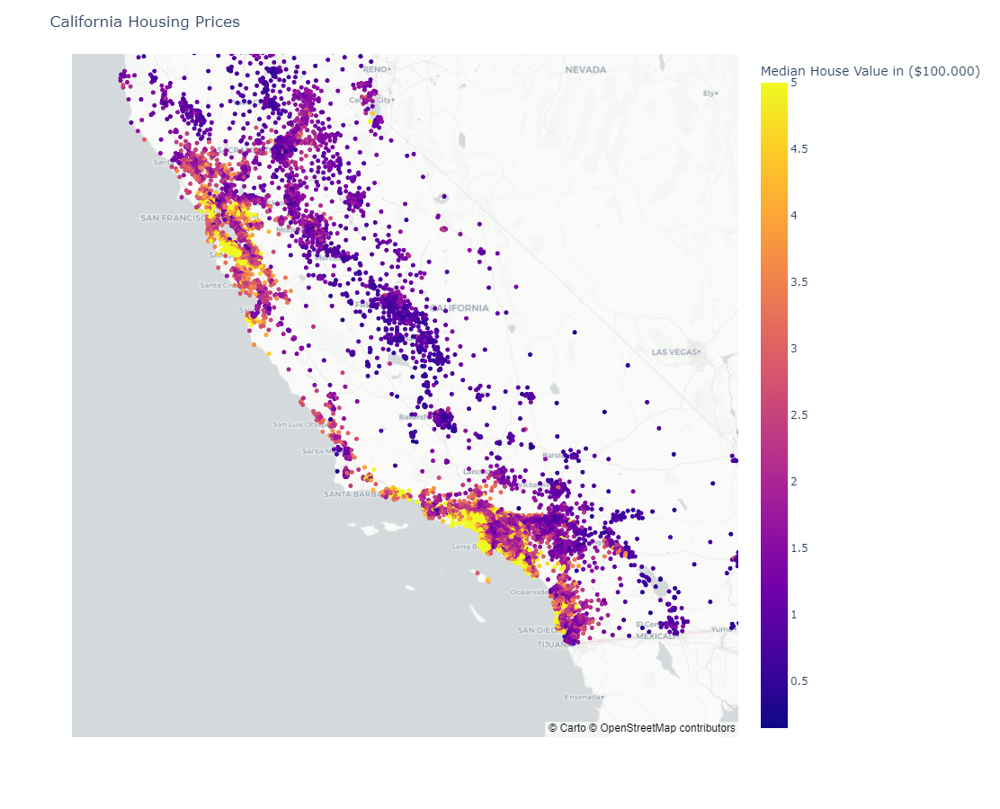

In [ ]:
# Create a scatter mapbox plot
fig = px.scatter_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    color='MedHouseVal',
    size_max=30,
    zoom=5.7,
    height=900
)

title = "California Housing Prices"
colorbar_title = "Median House Value in ($100.000)"

fig.update_layout(
    mapbox_style="carto-positron",
    title=title,
    coloraxis_colorbar=dict(
        title=colorbar_title
    )
)

fig.show()

For this example we will add the distance to 2 major cities, Los Angeles and San Fransisco.

In [ ]:
def haversine(lat1, lon1, lat2, lon2):
    '''
    Calculate the great circle distance between two points on the earth (specified in decimal degrees).

    The Haversine formula is used to calculate the distance between two points on the surface of a sphere,
    giving great-circle distances between the points (ignoring any hills, valleys, etc.).

    Parameters:
    lat1 (float): Latitude of the first point in decimal degrees.
    lon1 (float): Longitude of the first point in decimal degrees.
    lat2 (float): Latitude of the second point in decimal degrees.
    lon2 (float): Longitude of the second point in decimal degrees.

    Returns:
    float: Distance between the two points in kilometers.
    '''
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    km = 6371 * c
    return km

In [ ]:
df['distance_to_la'] = df.apply(lambda row: haversine(row['Latitude'], row['Longitude'], 34.0522, -118.2437), axis=1) # Los Angeles
df['distance_to_sf'] = df.apply(lambda row: haversine(row['Latitude'], row['Longitude'], 37.779269, -122.420006), axis=1) # San Fransisco

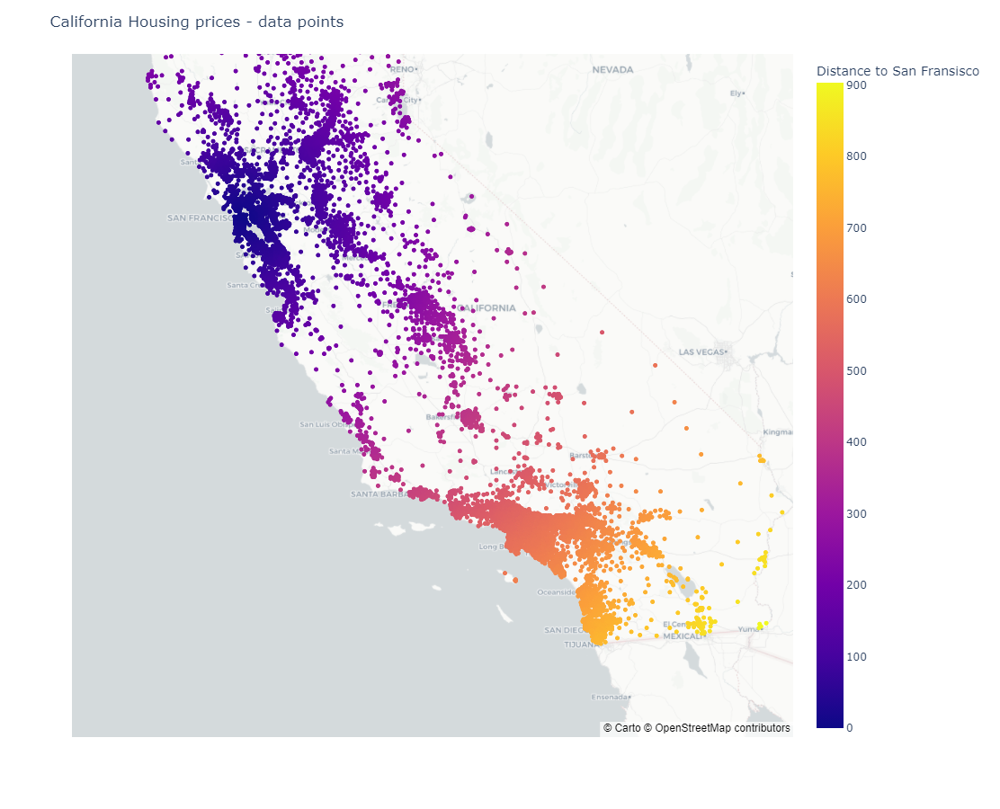

In [ ]:
# Create a scatter mapbox plot
fig = px.scatter_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    color='distance_to_sf',
    size_max=30,
    zoom=5.7,
    height=900
)

title = "California Housing prices - data points"
colorbar_title = "Distance to San Fransisco"

fig.update_layout(
    mapbox_style="carto-positron",
    title=title,
    coloraxis_colorbar=dict(
        title=colorbar_title
    )
)

fig.show()

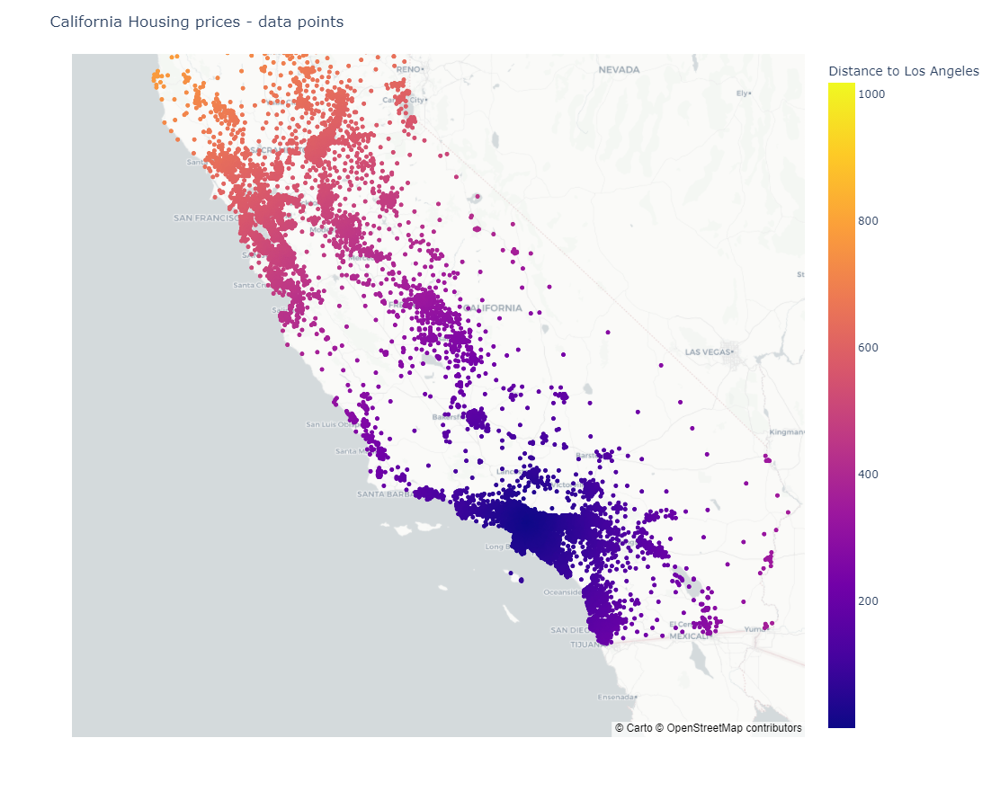

In [ ]:
# Create a scatter mapbox plot
fig = px.scatter_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    color='distance_to_la',
    size_max=30,
    zoom=5.7,
    height=900
)

title = "California Housing prices - data points"
colorbar_title = "Distance to Los Angeles"

fig.update_layout(
    mapbox_style="carto-positron",
    title=title,
    coloraxis_colorbar=dict(
        title=colorbar_title
    )
)

fig.show()

In [ ]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,distance_to_la,distance_to_sf
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,556.531199,20.097971
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,554.281885,19.728716
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,554.612739,17.660390
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,555.196283,16.878406
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,555.196283,16.878406


Mode target column again to the end for better visualization of the correlation matrix

In [ ]:
column_to_move = 'MedHouseVal'
columns = [col for col in df.columns if col != column_to_move] + [column_to_move]
df = df[columns]

## Visualize the distribution of the target variable

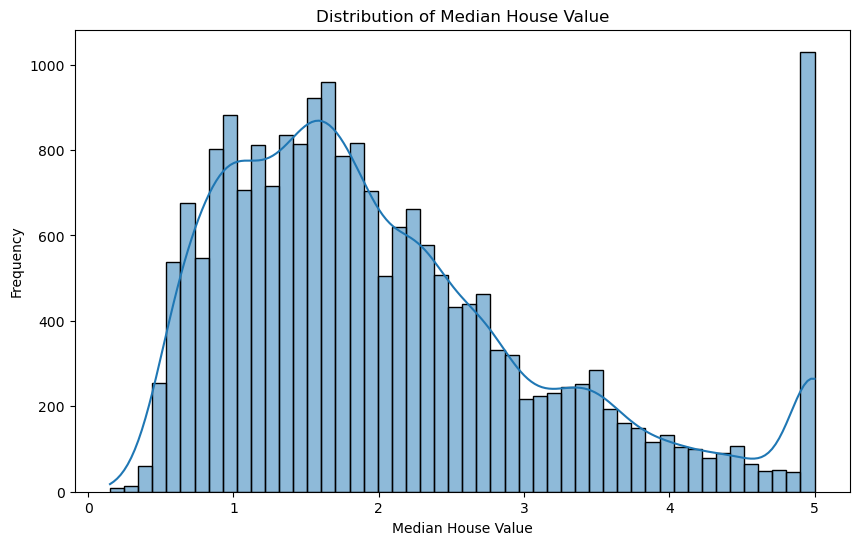

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['MedHouseVal'], bins=50, kde=True)
plt.title('Distribution of Median House Value')
plt.xlabel('Median House Value')
plt.ylabel('Frequency')
plt.show()

## Visualize the correlation matrix

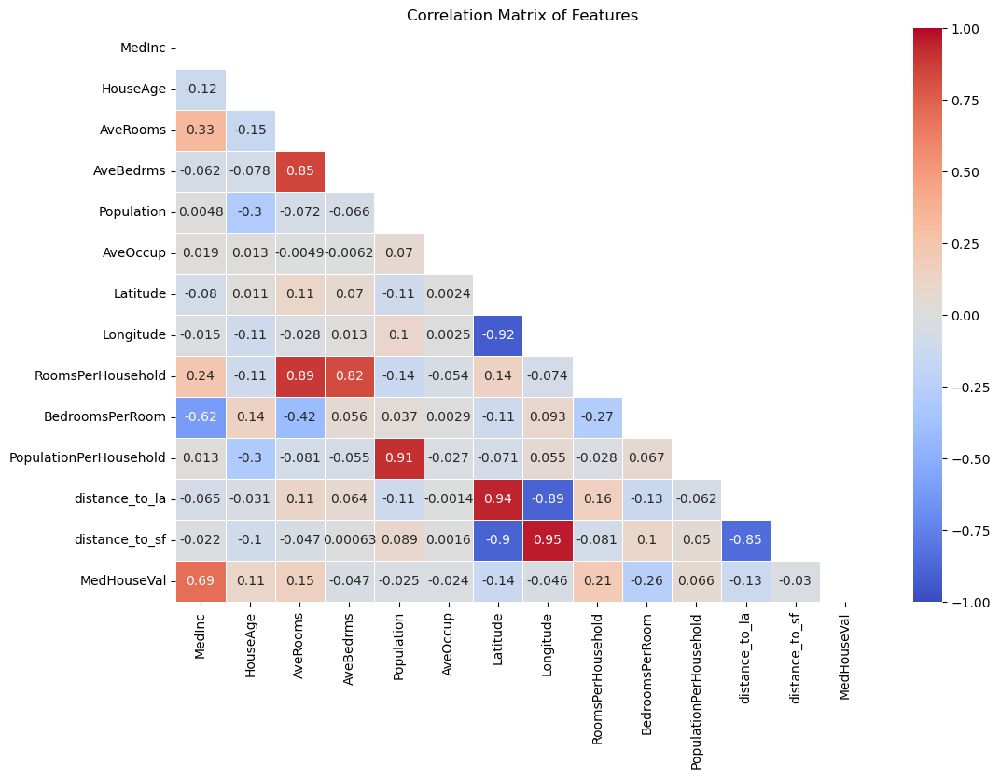

In [ ]:
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix,mask=mask, annot=True, cmap='coolwarm', linewidths=0.5,vmin=-1, vmax=1)
plt.title('Correlation Matrix of Features')
plt.show()

## Visualize geographical data

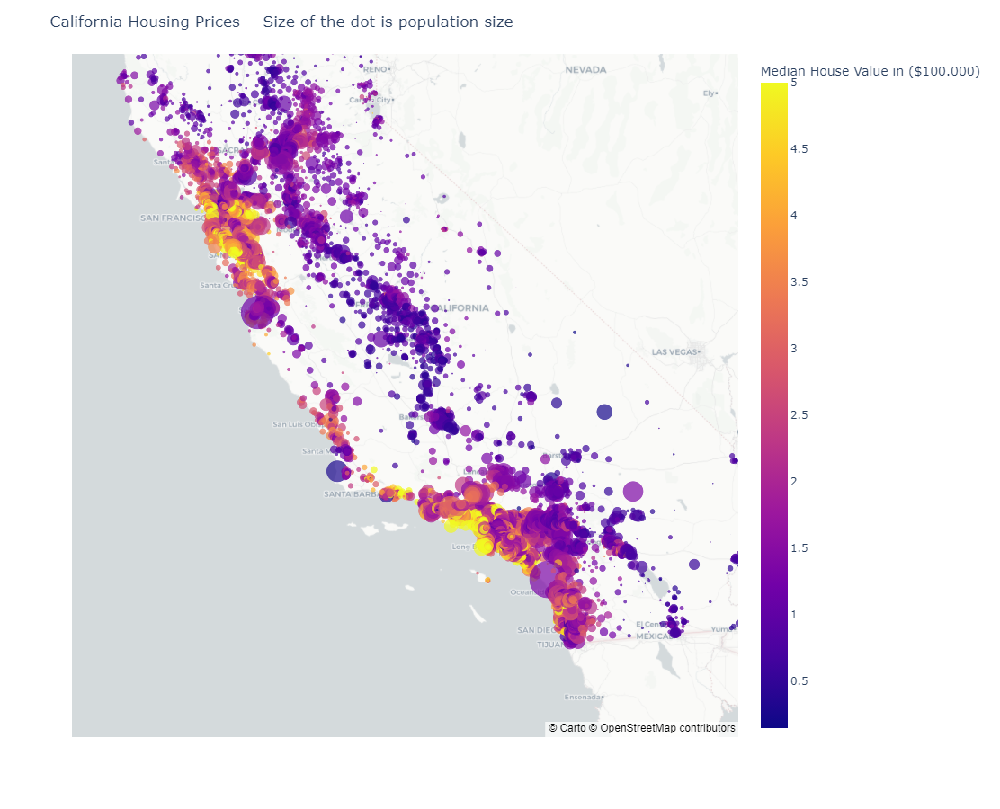

In [ ]:
# Create a scatter mapbox plot
fig = px.scatter_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    size=df['Population']/100,
    color='MedHouseVal',
    size_max=30,
    zoom=5.7,
    height=900
)

title = "California Housing Prices -  Size of the dot is population size"
colorbar_title = "Median House Value in ($100.000)"

fig.update_layout(
    mapbox_style="carto-positron",
    title=title,
    coloraxis_colorbar=dict(
        title=colorbar_title
    )
)

fig.show()

# 4. Modelling <a name="Modelling"></a>

## Data prep <a name="Data_prep"></a>

In [ ]:
# Split the dataset into features and target variable
X = df.drop('MedHouseVal', axis=1)
y = df['MedHouseVal']

In [ ]:
# Extract the feature names
feature_names = X.columns

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Apply scalar to the features:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Split features from target:
- drop('MedHouseVal', axis=1): Removes the target variable (MedHouseVal) from the features DataFrame (X).
- y = df['MedHouseVal']: Assigns the target variable to y.

Split the data into training and testing sets
- train_test_split: Splits the dataset into training and testing sets. test_size=0.2 indicates that 20% of the data is reserved for testing, and random_state=42 ensures reproducibility of the split.


Apply scalar to the features:
- StandardScaler
    - fit_transform: Fits the scaler to the training data and transforms it, standardizing the features to have zero mean and unit variance.
        - Fitting involves calculating the parameters (e.g., mean and standard deviation) necessary for scaling the data. These parameters are derived from the training data. For instance, when you use a StandardScaler from scikit-learn, the fit method computes the mean and standard deviation of each feature in the training dataset.
    - transform: It combines two steps: fitting the scaler to the data and then transforming the data. Here's a detailed explanation:       
        - Transforming applies the scaling to the data using the parameters computed during the fitting step. In the case of StandardScaler, the transformation standardizes the features by subtracting the mean and dividing by the standard deviation, resulting in features with zero mean and unit variance.

## Ridge Regression <a name="Ridge"></a>

- **Penalty**: Adds an L2 penalty (squared sum of coefficients) to the loss function.
- **Objective**: Minimize the sum of squared residuals with a constraint on the L2 norm of the coefficients.
- **Formula**:
  $$
  \text{min} \sum (y_i - \beta_0 - \sum \beta_j x_{ij})^2 + \alpha \sum \beta_j^2
  $$


Explanation of Ridge Regression Parameters
1. alpha
- Description: This parameter controls the regularization strength. It must be a positive float.
- Default: 1.0
- Impact: Larger values of alpha specify stronger regularization, which can help prevent overfitting by penalizing large coefficients in the model.

2. solver
- Description: This parameter specifies the algorithm to use in the optimization problem.
- Default: 'auto' (chooses the best solver based on the data)
- Available Options:
    - 'auto': Automatically chooses the best solver based on the type of data.
    - 'svd': Uses Singular Value Decomposition. Suitable for small datasets.
    - 'cholesky': Uses the Cholesky decomposition. Suitable for positive definite matrices.
    - 'lsqr': Uses the Least Squares QR decomposition. Suitable for large datasets.
    - 'sparse_cg': Uses Conjugate Gradient solver. Suitable for large datasets with sparse features.
    - 'sag': Uses Stochastic Average Gradient descent. Suitable for large datasets.
    - 'saga': Variant of 'sag' that also supports L1 regularization (elastic net).

3. max_iter
- Description: This parameter sets the maximum number of iterations for the solver to converge.
- Default: None (no limit on iterations)
- Impact: If the solver does not converge, increasing max_iter might help. This is particularly useful for iterative solvers like 'sag' and 'saga'.

4. tol
- Description: Tolerance for the optimization. Determines the stopping criterion.
- Default: 0.001
- Impact: Smaller values of tol can lead to more accurate solutions but may require more iterations.

5. fit_intercept
- Description: Whether to calculate the intercept for this model.
- Default: True
- Impact: If False, no intercept will be used in calculations (i.e., data is expected to be centered).

6. positive
- Description:  When set to `True`, forces the coefficients to be positive..
- Default: False
- Impact: If True, the regressors X will be normalized before regression by subtracting the mean and dividing by the L2 norm.

7. copy_X
- Description: If True, X will be copied; else, it may be overwritten.
- Default: True
- Impact: If True, limits the solver to 'lbfgs'.

8. random_state
- Description: Seed used by the random number generator, useful for reproducibility.
- Default: None
- Impact: Setting this parameter ensures that the model produces the same results each time it is run.

### Default

In [ ]:
# Apply Ridge Regression with default parameters
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)
y_pred_ridge = ridge.predict(X_test_scaled)

In [ ]:
# Extract the coefficients
coefficients = ridge.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)

print(f'Alpha = {ridge.alpha}')
print(coef_df)

Alpha = 1.0
          Feature  Coefficient
7       Longitude    -0.989642
0          MedInc     0.847938
6        Latitude    -0.783138
3       AveBedrms     0.328336
2        AveRooms    -0.279473
8  distance_to_la    -0.141561
1        HouseAge     0.114184
9  distance_to_sf     0.103310
5        AveOccup    -0.040630
4      Population    -0.004944


Metrics:
- mean_squared_error
- mean_absolute_error
- r2_score

These functions compute the MSE, MAE, and ##R^2 Score for the predictions, which are common metrics for evaluating regression models.

In [ ]:
# Evaluate the model
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

print(f'Ridge Regression MSE: {mse_ridge}')
print(f'Ridge Regression MAE: {mae_ridge}')
print(f'Ridge Regression R^2: {r2_ridge}')

Ridge Regression MSE: 0.5537232841706998
Ridge Regression MAE: 0.5330354328721114
Ridge Regression R^2: 0.5774423913715693


### Choosing the best Regularization Parameter (λ)

Hyperparameter Tuning:
- GridSearchCV: Performs an exhaustive search over specified parameter values (ridge_params) for the Ridge model using cross-validation (cv=5).
- fit: Trains multiple Ridge models with different alpha values and selects the best one based on the scoring metric (neg_mean_squared_error).
- best_estimator_: Retrieves the best model found by GridSearchCV.

In [ ]:
# Hyperparameter tuning using GridSearchCV
ridge_params = {'alpha':np.logspace(-6, 1, 50)}
ridge_grid = GridSearchCV(Ridge(), ridge_params, cv=10, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train_scaled, y_train)

# Get best estimator
best_ridge = ridge_grid.best_estimator_

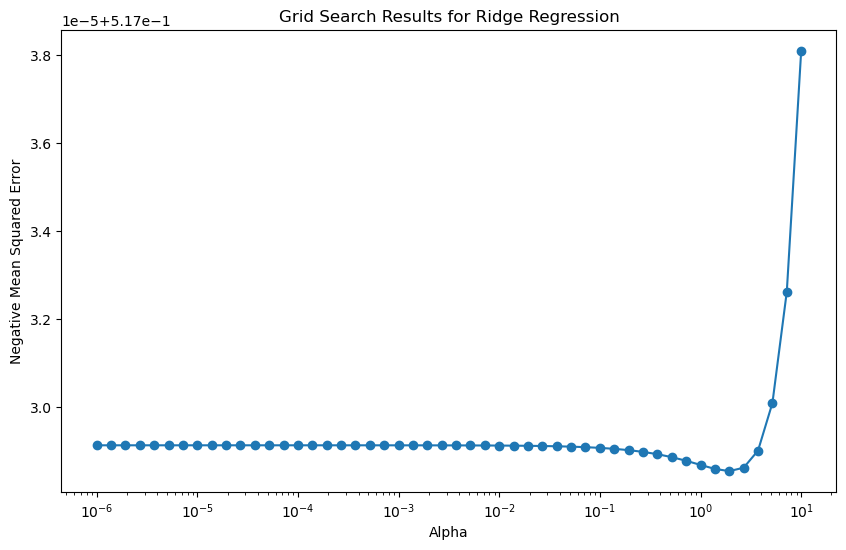

In [ ]:
# Extract results from GridSearchCV
results = pd.DataFrame(ridge_grid.cv_results_)

# Plot mean test scores for each alpha
plt.figure(figsize=(10, 6))
plt.plot(results['param_alpha'], -results['mean_test_score'], marker='o')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Negative Mean Squared Error')
plt.title('Grid Search Results for Ridge Regression')
plt.show()

In [ ]:
# Extract the coefficients
best_ridge_coefficients = best_ridge.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': best_ridge_coefficients})

# Display the coefficients sorted by their absolute value
print(f'Best Ridge Regression alpha= {best_ridge.alpha}')
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(coef_df)

Best Ridge Regression alpha= 1.9306977288832496
          Feature  Coefficient
7       Longitude    -0.988487
0          MedInc     0.847878
6        Latitude    -0.782427
3       AveBedrms     0.328111
2        AveRooms    -0.279298
8  distance_to_la    -0.141647
1        HouseAge     0.114243
9  distance_to_sf     0.102779
5        AveOccup    -0.040633
4      Population    -0.004931


In [ ]:
y_pred_best_ridge = best_ridge.predict(X_test_scaled)
mse_best_ridge = mean_squared_error(y_test, y_pred_best_ridge)
mae_best_ridge= mean_absolute_error(y_test, y_pred_best_ridge)
r2_best_ridge = r2_score(y_test, y_pred_best_ridge)

print(f'Best Ridge Regression MSE: {mse_best_ridge}')
print(f'Best Ridge Regression MAE: {mae_best_ridge}')
print(f'Best Ridge Regression R^2: {r2_best_ridge}')

Best Ridge Regression MSE: 0.5536911026955692
Best Ridge Regression MAE: 0.5330311785550574
Best Ridge Regression R^2: 0.5774669497160747


Show coefficient behaviour with different alpha values

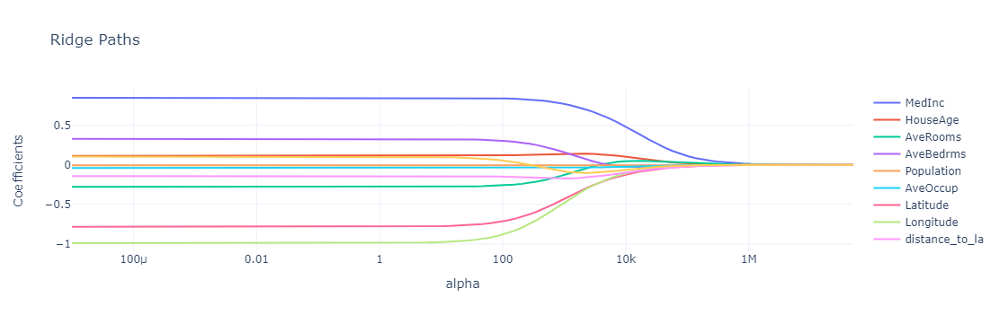

In [ ]:
# Define the range of alpha values using an eps-like parameter
alpha_max = 1e10
alpha_min = 1e-5
eps = 5e-3
alphas = np.logspace(np.log10(alpha_min), np.log10(alpha_max * eps), 100)

def plot_coefficient_path_ridge(X, y, feature_names, alphas):
    coefs = []

    for alpha in alphas:
        ridge = Ridge(alpha=alpha)
        ridge.fit(X, y)
        coefs.append(ridge.coef_)

    coefs = np.array(coefs)

    fig = go.Figure()

    # Add a trace for each feature
    for i, feature_name in enumerate(feature_names):
        fig.add_trace(go.Scatter(
            x=alphas,
            y=coefs[:, i],
            mode='lines',
            name=feature_name
        ))

    fig.update_layout(
        title='Ridge Paths',
        xaxis=dict(title='alpha', type='log'),
        yaxis=dict(title='Coefficients'),
        template='plotly_white'
    )

    fig.show()

# Plot coefficient paths for Ridge with feature names and custom alphas
plot_coefficient_path_ridge(X_train_scaled, y_train, feature_names, alphas)

## Lasso Regression <a name="Lasso"></a>

- **Penalty**: Adds an L1 penalty (sum of absolute values of coefficients) to the loss function.
- **Objective**: Minimize the sum of squared residuals with a constraint on the L1 norm of the coefficients.
- **Formula**:
  $$
  \text{min} \sum (y_i - \beta_0 - \sum \beta_j x_{ij})^2 + \alpha \sum |\beta_j|
  $$
- **Effect**: Can produce sparse models where some coefficients are exactly zero, effectively performing feature selection.

Explanation of Lasso Regression Parameters

1. alpha
- Description: Controls the regularization strength. Must be a positive float.
- Default: 1.0
- Impact: Larger values specify stronger regularization, which can help prevent overfitting by penalizing large coefficients.

2. max_iter
- Description: Maximum number of iterations for the solver to converge.
- Default: 1000
- Impact: If the solver does not converge, increasing max_iter might help.

3. tol
- Description: Tolerance for the optimization. Determines the stopping criterion.
- Default: 0.0001
- Impact: Smaller values of tol can lead to more accurate solutions but may require more iterations.

4. fit_intercept
- Description: Whether to calculate the intercept for this model.
- Default: True
- Impact: If False, no intercept will be used in calculations (i.e., data is expected to be centered).

5. warm_start
- Description: When set to True, reuse the solution of the previous call to fit as initialization, otherwise, just erase the previous solution.
- Default: False
- Impact: Potentially speed up the convergence of the optimization process by using previous coefficients as a starting point.

6. precompute
- Description: Whether to use a precomputed Gram matrix to speed up calculations.
- Default: False
- Impact: Can speed up calculations if set to True or provided with a precomputed Gram matrix.

7. copy_X
- Description: If True, X will be copied; else, it may be overwritten.
- Default: True
- Impact: If False, the input data may be modified, which can save memory but lead to unexpected changes.

8. positive
- Description: When set to True, forces the coefficients to be positive.
- Default: False
- Impact: Useful when the model should only have positive coefficients.

9. selection
- Description: If set to random, a random coefficient is updated every iteration rather than looping over features sequentially.
- Default: cyclic
- Impact: Can affect the convergence speed and solution.

10. random_state
- Description: Seed used by the random number generator, useful for reproducibility.
- Default: None
- Impact: Setting this parameter ensures that the model produces the same results each time it is run.

### Default

In [ ]:
# Apply Lasso Regression with default parameters
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
y_pred_lasso = lasso.predict(X_test_scaled)

In [ ]:
# Extract the coefficients
coefficients = lasso.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'Alpha = {lasso.alpha}')
print(coef_df)


Alpha = 1.0
          Feature  Coefficient
0          MedInc          0.0
1        HouseAge          0.0
2        AveRooms          0.0
3       AveBedrms         -0.0
4      Population         -0.0
5        AveOccup         -0.0
6        Latitude         -0.0
7       Longitude         -0.0
8  distance_to_la         -0.0
9  distance_to_sf         -0.0


Metrics:
- mean_squared_error
- mean_absolute_error
- r2_score

These functions compute the MSE, MAE, and ##R^2 Score for the predictions, which are common metrics for evaluating regression models.

In [ ]:
# Evaluate the model
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

print(f'Lasso Regression MSE: {mse_lasso}')
print(f'Lasso Regression MAE: {mae_lasso}')
print(f'Lasso Regression R^2: {r2_lasso}')

Lasso Regression MSE: 1.3106960720039365
Lasso Regression MAE: 0.9060685490007149
Lasso Regression R^2: -0.00021908714592466794


### Choosing the best Regularization Parameter (λ)

Hyperparameter Tuning:
- GridSearchCV: Performs an exhaustive search over specified parameter values (lasso_params) for the Lasso model using cross-validation (cv=5).
- fit: Trains multiple Lasso models with different alpha values and selects the best one based on the scoring metric (neg_mean_squared_error).
- best_estimator_: Retrieves the best model found by GridSearchCV.

In [ ]:
# Hyperparameter tuning using GridSearchCV
lasso_params = {'alpha':np.logspace(-6, 1, 50)}
lasso_grid = GridSearchCV(Lasso(), lasso_params, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train_scaled, y_train)
best_lasso = lasso_grid.best_estimator_

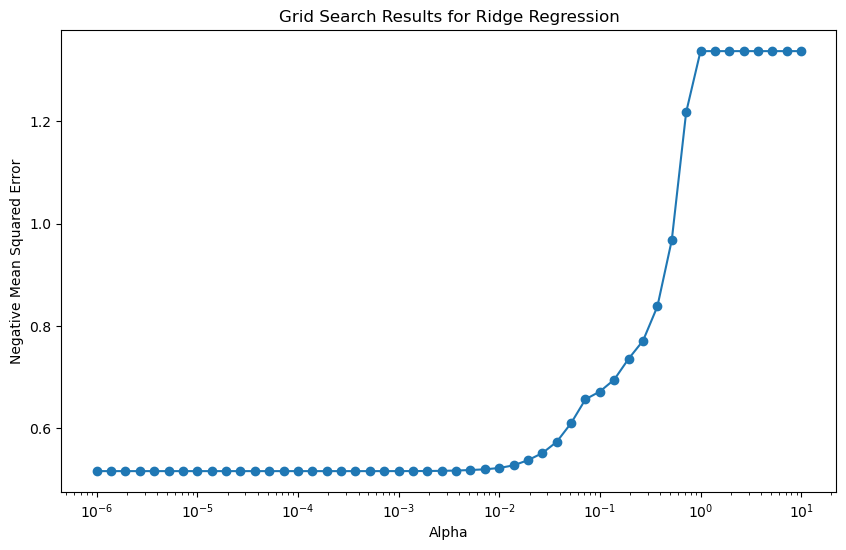

In [ ]:
# Extract results from GridSearchCV
results = pd.DataFrame(lasso_grid.cv_results_)

# Plot mean test scores for each alpha
plt.figure(figsize=(10, 6))
plt.plot(results['param_alpha'], -results['mean_test_score'], marker='o')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Negative Mean Squared Error')
plt.title('Grid Search Results for Ridge Regression')
plt.show()

In [ ]:
# Extract the coefficients
best_lasso_coefficients = best_lasso.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': best_lasso_coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'Beste Alpha = {best_lasso.alpha}')
print(coef_df)


Beste Alpha = 0.00026826957952797245
          Feature  Coefficient
7       Longitude    -0.982815
0          MedInc     0.846584
6        Latitude    -0.782528
3       AveBedrms     0.325171
2        AveRooms    -0.276345
8  distance_to_la    -0.140097
1        HouseAge     0.114349
9  distance_to_sf     0.098449
5        AveOccup    -0.040370
4      Population    -0.004662


In [ ]:
y_pred_best_lasso = best_lasso.predict(X_test_scaled)
mse_best_lasso = mean_squared_error(y_test, y_pred_best_lasso)
mae_best_lasso = mean_absolute_error(y_test, y_pred_best_lasso)
r2_best_lasso = r2_score(y_test, y_pred_best_lasso)

print(f'Best Lasso Regression MSE: {mse_best_lasso}')
print(f'Best Lasso Regression MAE: {mae_best_lasso}')
print(f'Best Lasso Regression R^2: {r2_best_lasso}')

Best Lasso Regression MSE: 0.5533673294115755
Best Lasso Regression MAE: 0.5330094963168399
Best Lasso Regression R^2: 0.5777140277576402


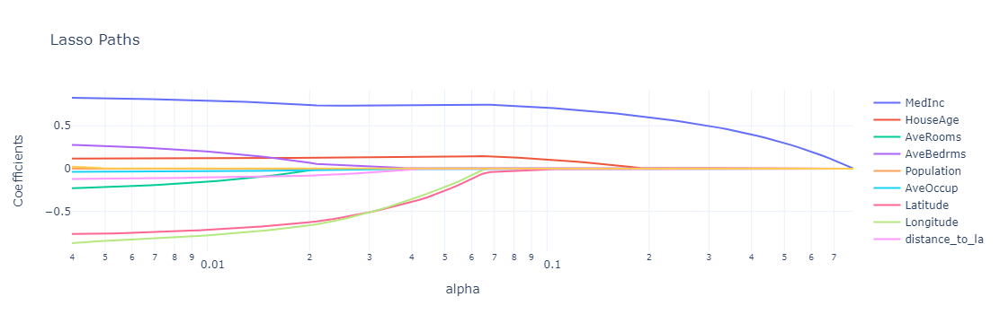

In [ ]:
def plot_coefficient_path_lasso(X, y, feature_names):
    alphas, coefs, _ = lasso_path(X, y, eps=5e-3)

    fig = go.Figure()

    # Add a trace for each feature
    for i, feature_name in enumerate(feature_names):
        fig.add_trace(go.Scatter(
            x=alphas,
            y=coefs[i],
            mode='lines',
            name=feature_name
        ))

    fig.update_layout(
        title='Lasso Paths',
        xaxis=dict(title='alpha', type='log'),
        yaxis=dict(title='Coefficients'),
        template='plotly_white'
    )

    fig.show()

# Plot coefficient paths for Lasso with feature names
plot_coefficient_path_lasso(X_train_scaled, y_train, feature_names)

## ElasticNet Regression <a name="ElasticNet"></a>

- **Penalty**: Combines both L1 and L2 penalties.
- **Objective**: Minimize the sum of squared residuals with constraints on both the L1 and L2 norms of the coefficients.
- **Formula**:
  $$
  \text{min} \sum (y_i - \beta_0 - \sum \beta_j x_{ij})^2 + \alpha_1 \sum |\beta_j| + \alpha_2 \sum \beta_j^2
  $$
- **Effect**: Balances the benefits of Ridge and Lasso, useful when there are multiple correlated features.

Explanation of ElasticNet Regression Parameters

1. alpha
- Description: Controls the regularization strength. Must be a positive float.
- Default: 1.0
- Impact: Larger values specify stronger regularization, which can help prevent overfitting by penalizing large coefficients.

2. l1_ratio
- Description: The ElasticNet mixing parameter, with 0 <= l1_ratio <= 1.
- Default: 0.5
- Impact: For l1_ratio = 0 the penalty is an L2 penalty. For l1_ratio = 1 it is an L1 penalty. For 0 < l1_ratio < 1, the penalty is a combination of L1 and L2.

3. max_iter
- Description: Maximum number of iterations for the solver to converge.
- Default: 1000
- Impact: If the solver does not converge, increasing max_iter might help.

4. tol
- Description: Tolerance for the optimization. Determines the stopping criterion.
- Default: 0.0001
- Impact: Smaller values of tol can lead to more accurate solutions but may require more iterations.

5. fit_intercept
- Description: Whether to calculate the intercept for this model.
- Default: True
- Impact: If False, no intercept will be used in calculations (i.e., data is expected to be centered).

5. warm_start
- Description: When set to True, reuse the solution of the previous call to fit as initialization, otherwise, just erase the previous solution.
- Default: False
- Impact: Potentially speed up the convergence of the optimization process by using previous coefficients as a starting point.

7. precompute
- Description: Whether to use a precomputed Gram matrix to speed up calculations.
- Default: False
- Impact: Can speed up calculations if set to True or provided with a precomputed Gram matrix.

8. copy_X
- Description: If True, X will be copied; else, it may be overwritten.
- Default: True
- Impact: If False, the input data may be modified, which can save memory but lead to unexpected changes.

9. positive
- Description: When set to True, forces the coefficients to be positive.
- Default: False
- Impact: Useful when the model should only have positive coefficients.

10. selection
- Description: If set to random, a random coefficient is updated every iteration rather than looping over features sequentially.
- Default: cyclic
- Impact: Can affect the convergence speed and solution.

11. random_state
- Description: Seed used by the random number generator, useful for reproducibility.
- Default: None
- Impact: Setting this parameter ensures that the model produces the same results each time it is run.

### Default

In [ ]:
# Apply ElasticNet Regression with default parameters
elastic_net = ElasticNet()
elastic_net.fit(X_train_scaled, y_train)
y_pred_elastic_net = elastic_net.predict(X_test_scaled)


In [ ]:
# Extract the coefficients
coefficients = elastic_net.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'Alpha={elastic_net.alpha}')
print(f'L1 ratio={elastic_net.l1_ratio}')
print(coef_df)

Alpha=1.0
L1 ratio=0.5
          Feature  Coefficient
0          MedInc     0.199013
1        HouseAge     0.000000
2        AveRooms     0.000000
3       AveBedrms    -0.000000
4      Population    -0.000000
5        AveOccup    -0.000000
6        Latitude    -0.000000
7       Longitude    -0.000000
8  distance_to_la    -0.000000
9  distance_to_sf    -0.000000


Metrics:
- mean_squared_error
- mean_absolute_error
- r2_score

These functions compute the MSE, MAE, and ##R^2 Score for the predictions, which are common metrics for evaluating regression models.

In [ ]:
# Evaluate the model
mse_elastic_net = mean_squared_error(y_test, y_pred_elastic_net)
mae_elastic_net = mean_absolute_error(y_test, y_pred_elastic_net)
r2_elastic_net = r2_score(y_test, y_pred_elastic_net)

print(f'ElasticNet Regression MSE: {mse_elastic_net}')
print(f'ElasticNet Regression MAE: {mae_elastic_net}')
print(f'ElasticNet Regression R^2: {r2_elastic_net}')

ElasticNet Regression MSE: 1.0442308546929173
ElasticNet Regression MAE: 0.8059952028394123
ElasticNet Regression R^2: 0.2031259919367321


### Choosing the best Regularization Parameters (λ & L1_ratio)

Hyperparameter Tuning:
- GridSearchCV: Performs an exhaustive search over specified parameter values (elastic_net_params) for the ElasticNet model using cross-validation (cv=5).
- fit: Trains multiple ElasticNet models with different alpha and l1_ratio values and selects the best one based on the scoring metric (neg_mean_squared_error).
- best_estimator_: Retrieves the best model found by GridSearchCV.

In [ ]:
# Hyperparameter tuning using GridSearchCV
elastic_net_params = {'alpha': [0.01, 0.1, 1.0, 10.0], 'l1_ratio': [0.1, 0.5, 0.9]}

elastic_net_grid = GridSearchCV(ElasticNet(), elastic_net_params, cv=5, scoring='neg_mean_squared_error')
elastic_net_grid.fit(X_train_scaled, y_train)
best_elastic_net = elastic_net_grid.best_estimator_

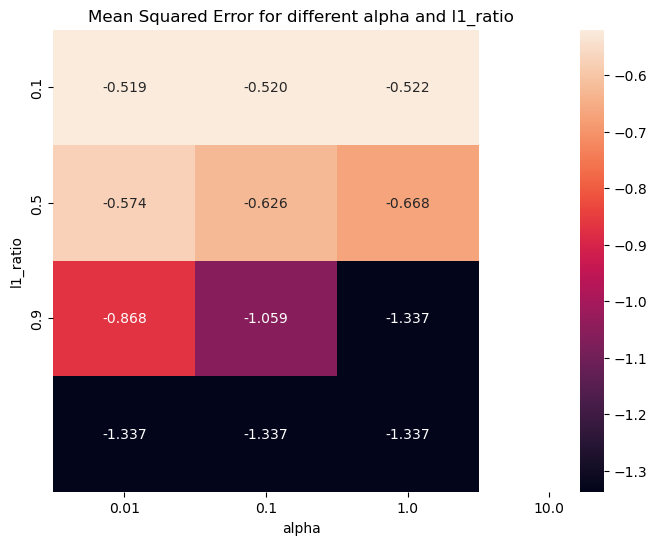

In [ ]:
# Extract results from grid search
results = elastic_net_grid.cv_results_
mean_test_score = results['mean_test_score'].reshape(4, 3)

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(mean_test_score, annot=True, fmt=".3f", xticklabels= [0.01, 0.1, 1.0, 10.0], yticklabels=[0.1, 0.5, 0.9])
plt.xlabel('alpha')
plt.ylabel('l1_ratio')
plt.title('Mean Squared Error for different alpha and l1_ratio')
plt.show()

In [ ]:
# Extract the coefficients
best_elastic_net_coefficients = best_elastic_net.coef_

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': best_elastic_net_coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'Alpha={best_elastic_net.alpha}')
print(f'L1 ratio={best_elastic_net.l1_ratio}')
print(coef_df)

Alpha=0.01
L1 ratio=0.1
          Feature  Coefficient
0          MedInc     0.831730
7       Longitude    -0.814333
6        Latitude    -0.683174
3       AveBedrms     0.281870
2        AveRooms    -0.239631
8  distance_to_la    -0.149132
1        HouseAge     0.122519
5        AveOccup    -0.039905
9  distance_to_sf     0.020354
4      Population    -0.002102


In [ ]:
y_pred_best_elastic_net = best_elastic_net.predict(X_test_scaled)
mse_best_elastic_net = mean_squared_error(y_test, y_pred_best_elastic_net)
mae_best_elastic_net = mean_absolute_error(y_test, y_pred_best_elastic_net)
r2_best_elastic_net= r2_score(y_test, y_pred_best_elastic_net)

print(f'Best ElasticNet Regression MSE: {mse_best_elastic_net}')
print(f'Best ElasticNet Regression MAE: {mae_best_elastic_net}')
print(f'Best ElasticNet Regression R^2: {r2_best_elastic_net}')

Best ElasticNet Regression MSE: 0.5505224608402859
Best ElasticNet Regression MAE: 0.5339062658030546
Best ElasticNet Regression R^2: 0.5798850053825866


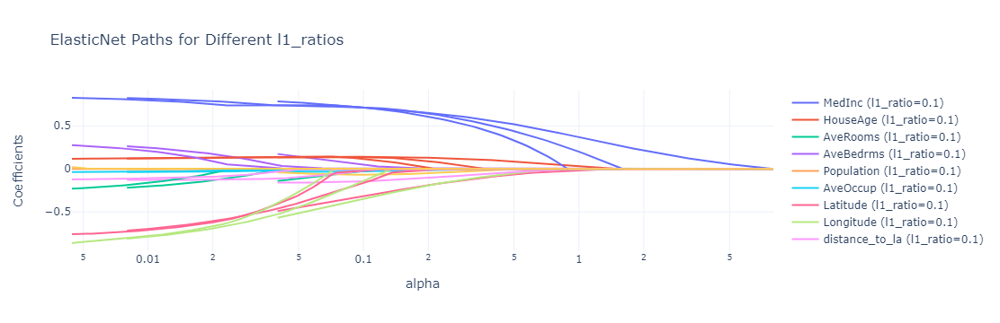

In [ ]:
def plot_coefficient_path_elasticnet(X, y, feature_names, l1_ratios):
    fig = go.Figure()

    # Iterate over each l1_ratio
    for l1_ratio in l1_ratios:
        alphas, coefs, _ = enet_path(X, y, l1_ratio=l1_ratio, eps=5e-3)

        # Add a trace for each feature for the current l1_ratio
        for i, feature_name in enumerate(feature_names):
            fig.add_trace(go.Scatter(
                x=alphas,
                y=coefs[i],
                mode='lines',
                name=f'{feature_name} (l1_ratio={l1_ratio})'
            ))

    fig.update_layout(
        title='ElasticNet Paths for Different l1_ratios',
        xaxis=dict(title='alpha', type='log'),
        yaxis=dict(title='Coefficients'),
        template='plotly_white'
    )

    fig.show()

# Plot coefficient paths for ElasticNet with feature names and different l1_ratios
plot_coefficient_path_elasticnet(X_train_scaled, y_train, feature_names, l1_ratios=[0.1, 0.5, 0.9])
# plot_coefficient_path_elasticnet(X_train_scaled, y_train, feature_names, l1_ratios=[0.1])

## Support Vector Machines (SVM) <a name="SVM"></a>

Ridge, Lasso, and ElasticNet are regularization techniques used in linear regression models to prevent overfitting by adding a penalty to the loss function. Support Vector Machines (SVMs) are a different class of models primarily used for classification and regression tasks, particularly known for their effectiveness in high-dimensional spaces.

- **Objective**: Find the hyperplane that best separates the classes in the feature space for classification tasks, or fits the best line within a margin for regression tasks (SVR).
- **Classification**: Maximizes the margin between the closest points of the classes (support vectors).
- **Regression (SVR)**: Fits the decision function within a specified margin of tolerance.
- **Formulation**:
  - **Classification**:
    $$
    \text{min} \frac{1}{2} ||w||^2 \text{ subject to } y_i (w \cdot x_i + b) \geq 1
    $$
  - **Regression**:
    $$
    \text{min} \frac{1}{2} ||w||^2 + C \sum \xi_i \text{ subject to } |y_i - (w \cdot x_i + b)| \leq \epsilon + \xi_i
    $$

**Link between Ridge, Lasso, ElasticNet, and SVM**

1. **Regularization**:
   - Ridge, Lasso, and ElasticNet use regularization to control the complexity of the model, similar to how SVMs control the margin width and penalize misclassifications (slack variables).
   - In SVMs, the regularization parameter $ C $ controls the trade-off between maximizing the margin and minimizing classification error.

2. **Optimization**:
   - All these methods involve solving optimization problems.
   - Ridge and Lasso solve linear regression problems with different types of penalties.
   - SVMs solve quadratic programming problems to find the optimal hyperplane.

3. **Feature Selection**:
   - Lasso and ElasticNet can perform feature selection by driving some coefficients to zero.
   - SVMs can implicitly select important features by focusing on support vectors, which are the critical data points for defining the decision boundary.

4. **Dimensionality**:
   - SVMs are particularly effective in high-dimensional spaces, similar to how Ridge regression can handle multicollinearity by shrinking coefficients.
   - ElasticNet is useful in high-dimensional spaces where there are many correlated features, similar to SVMs dealing with complex decision boundaries.

Explanation of Support Vector Machines (SVM) regression Parameters

1. kernel
- Description: Specifies the kernel type to be used in the algorithm.
- Default: 'rbf'
- Options:
    - 'linear': Linear kernel.
    - 'poly': Polynomial kernel.
    - 'rbf': Radial basis function (Gaussian) kernel.
    - 'sigmoid': Sigmoid kernel.
    - 'precomputed': Precomputed kernel matrix.

2. C
- Description: Regularization parameter. The strength of the regularization is inversely proportional to C.
- Default: 1.0
- Impact: Larger values of C mean less regularization, which can lead to overfitting. Smaller values specify stronger regularization.

3. epsilon
- Description: Specifies the epsilon-tube within which no penalty is associated in the training loss function.
- Default: 0.1
- Impact: Larger values increase the epsilon-tube, resulting in fewer support vectors, which can help with robustness to noise.

4. gamma
- Description: Kernel coefficient for 'rbf', 'poly', and 'sigmoid'.
- Default: 'scale'
- Options:
    - 'scale': Uses 1 / (n_features * X.var()) as value of gamma.
    - 'auto': Uses 1 / n_features.
- Impact: Higher values make the decision boundary tighter around the data points, while lower values make it more general.

5. degree
- Description: Degree of the polynomial kernel function ('poly'). Ignored by all other kernels.
- Default: 3
- Impact: Higher degrees increase the complexity of the decision boundary.

6. coef0
- Description: Independent term in kernel function. It is only significant in 'poly' and 'sigmoid'.
- Default: 0.0
- Impact: Adjusts the influence of higher-order versus lower-order terms in the polynomial and sigmoid kernels.

7. tol
- Description: Tolerance for stopping criterion.
- Default: 0.001
- Impact: Smaller values can lead to more precise solutions but may require more iterations.

8. max_iter
- Description: Hard limit on iterations within the solver.
- Default: -1 (no limit)
- Impact: Setting a limit can help prevent long training times, but may result in non-convergence.

8. shrinking
- Description:  Whether to use the shrinking heuristic
- Default: True
- Impact: The shrinking heuristic speeds up training by focusing on difficult-to-classify samples, potentially reducing the number of iterations


8. verbose
- Description: Enable verbose output
- Default: False
- Impact: Provides detailed output about the training process, useful for debugging and understanding model behavior.


8. cache_size
- Description: Specify the size of the kernel cache
- Default: 200
- Impact:
    - Larger Cache: Can speed up training by storing more kernel computations, especially beneficial for large datasets.
    - Smaller Cache: May result in slower training due to frequent recomputation of kernel values, but uses less memory.


### Default

In [ ]:
# Apply Support Vector Regression (SVR) with default parameters
svr = SVR(kernel='linear') # Using linear instead of default due to link with previous techniques
svr.fit(X_train_scaled, y_train)
y_pred_svr = svr.predict(X_test_scaled)

In [ ]:
# Extract the coefficients
coefficients = svr.coef_[0]

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'C value = {svr.C}')
print(coef_df)

C value = 1.0
          Feature  Coefficient
0          MedInc     0.911805
7       Longitude    -0.900141
5        AveOccup    -0.731067
6        Latitude    -0.651318
3       AveBedrms     0.403014
2        AveRooms    -0.350580
9  distance_to_sf     0.136998
8  distance_to_la    -0.128835
1        HouseAge     0.081000
4      Population     0.011156


Incase the kernal is not `linear` there are also other options to get the feature importance

In [ ]:
# Calculate permutation feature importance
perm_importance = permutation_importance(svr, X_test_scaled, y_test, n_repeats=10, random_state=42)

# Create a DataFrame to display the feature importances
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': perm_importance.importances_mean})

# Display the importances sorted by their value
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print(importance_df)

          Feature  Importance
7       Longitude    1.211961
0          MedInc    1.148257
6        Latitude    0.669680
3       AveBedrms    0.357807
2        AveRooms    0.346468
9  distance_to_sf    0.029972
8  distance_to_la    0.029090
5        AveOccup    0.018375
1        HouseAge    0.015443
4      Population    0.000109


In [ ]:
# Use RFE to select the most important features
selector = RFE(svr, n_features_to_select=1, step=1)
selector = selector.fit(X_train_scaled, y_train)

# Extract the feature names
feature_names = X.columns

# Create a DataFrame to display the ranking of features
ranking_df = pd.DataFrame({'Feature': feature_names, 'Ranking': selector.ranking_})

# Display the ranking sorted by their importance
ranking_df = ranking_df.sort_values(by='Ranking')
print(ranking_df)

          Feature  Ranking
6        Latitude        1
7       Longitude        2
0          MedInc        3
5        AveOccup        4
3       AveBedrms        5
2        AveRooms        6
8  distance_to_la        7
9  distance_to_sf        8
1        HouseAge        9
4      Population       10


Metrics:
- mean_squared_error
- mean_absolute_error
- r2_score

These functions compute the MSE, MAE, and R^2 Score for the predictions, which are common metrics for evaluating regression models.

In [ ]:
# Evaluate the model
mse_svr = mean_squared_error(y_test, y_pred_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print(f'Support Vector Regression MSE: {mse_svr}')
print(f'Support Vector Regression MAE: {mae_svr}')
print(f'Support Vector Regression R^2: {r2_svr}')

Support Vector Regression MSE: 0.5777424884967245
Support Vector Regression MAE: 0.5102982002959258
Support Vector Regression R^2: 0.5591128433259903


### Choosing the best Parameterc (C)

Hyperparameter Tuning:
- GridSearchCV: Performs an exhaustive search over specified parameter values (svr_params) for the SVR model using cross-validation (cv=5).
- fit: Trains multiple SVR models with different C and kernel values and selects the best one based on the scoring metric (neg_mean_squared_error).
- best_estimator_: Retrieves the best model found by GridSearchCV.

In [ ]:
# Hyperparameter tuning using GridSearchCV
# svr_params = {'C': [0.1, 1.0, 10.0, 100.0],'kernel' : ['linear','rbf']}
# svr_grid = GridSearchCV(SVR(), svr_params, cv=5, scoring='neg_mean_squared_error')

svr_params = {'C': [0.1, 1.0, 10.0, 100.0]}
svr_grid = GridSearchCV(SVR(kernel='linear'), svr_params, cv=5, scoring='neg_mean_squared_error')

svr_grid.fit(X_train_scaled, y_train)
best_svr = svr_grid.best_estimator_

In [ ]:
# Extract the coefficients
coefficients = best_svr.coef_[0]

# Create a DataFrame to display the coefficients alongside the feature names
coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Display the coefficients sorted by their absolute value
coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
print(f'C value = {best_svr.C}')
print(coef_df)

C value = 0.1
          Feature  Coefficient
0          MedInc     0.911992
7       Longitude    -0.888834
5        AveOccup    -0.672929
6        Latitude    -0.648289
3       AveBedrms     0.401202
2        AveRooms    -0.348606
9  distance_to_sf     0.132013
8  distance_to_la    -0.124985
1        HouseAge     0.081367
4      Population     0.010224


In [ ]:
y_pred_best_svr = best_svr.predict(X_test_scaled)
mse_best_svr = mean_squared_error(y_test, y_pred_best_svr)
mae_best_svr = mean_absolute_error(y_test, y_pred_best_svr)
r2_best_svr = r2_score(y_test, y_pred_best_svr)

print(f'Best Support Vector Regression C: {best_svr.C}')
print(f'Best Support Vector Regression Kernel: {best_svr.kernel}')
print(f'Best Support Vector Regression MSE: {mse_best_svr}')
print(f'Best Support Vector Regression MAE: {mae_best_svr}')
print(f'Best Support Vector Regression R^2: {r2_best_svr}')

Best Support Vector Regression C: 0.1
Best Support Vector Regression Kernel: linear
Best Support Vector Regression MSE: 0.5779718592826019
Best Support Vector Regression MAE: 0.5108790330817088
Best Support Vector Regression R^2: 0.5589378057692534


## Model Comparisons and Visualizations <a name="Model_comparison"></a>

We will create a pandas DataFrame to store the MSE, MAE, and R^2 scores of each model. This allows us to compare the performance of different models in a structured manner.

In [ ]:
# Create a DataFrame to compare the models
model_comparison = pd.DataFrame({
    'Model': ['Ridge', 'Best Ridge', 'Lasso', 'Best Lasso', 'ElasticNet', 'Best ElasticNet', 'SVR', 'Best SVR'],
    'MSE': [mse_ridge, mse_best_ridge, mse_lasso, mse_best_lasso, mse_elastic_net, mse_best_elastic_net, mse_svr, mse_best_svr],
    'MAE': [mae_ridge, mean_absolute_error(y_test, y_pred_best_ridge), mae_lasso, mean_absolute_error(y_test, y_pred_best_lasso), mae_elastic_net, mean_absolute_error(y_test, y_pred_best_elastic_net), mae_svr, mean_absolute_error(y_test, y_pred_best_svr)],
    'R^2': [r2_ridge, r2_score(y_test, y_pred_best_ridge), r2_lasso, r2_score(y_test, y_pred_best_lasso), r2_elastic_net, r2_score(y_test, y_pred_best_elastic_net), r2_svr, r2_score(y_test, y_pred_best_svr)]
})


In [ ]:
# Display the comparison DataFrame
model_comparison

,Model,MSE,MAE,R^2
0,Ridge,0.553723,0.533035,0.577442
1,Best Ridge,0.553691,0.533031,0.577467
2,Lasso,1.310696,0.906069,-0.000219
3,Best Lasso,0.553367,0.533009,0.577714
4,ElasticNet,1.044231,0.805995,0.203126
5,Best ElasticNet,0.550522,0.533906,0.579885
6,SVR,0.577742,0.510298,0.559113
7,Best SVR,0.577972,0.510879,0.558938


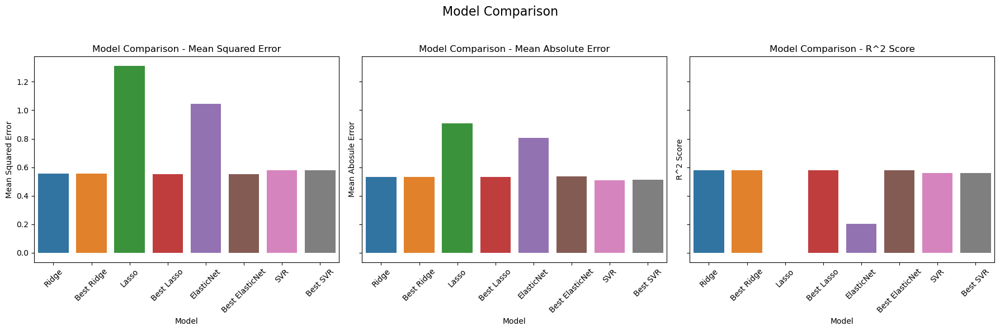

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)


# Ridge Plot
sns.barplot(x='Model', y='MSE', data=model_comparison, ax=axes[0])
axes[0].set_title('Model Comparison - Mean Squared Error')
axes[0].set_ylabel('Mean Squared Error')
axes[0].set_xlabel('Model')
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(x='Model', y='MAE', data=model_comparison, ax=axes[1])
axes[1].set_title('Model Comparison - Mean Absolute Error')
axes[1].set_ylabel('Mean Abosule Error')
axes[1].set_xlabel('Model')
axes[1].tick_params(axis='x', rotation=45)

sns.barplot(x='Model', y='R^2', data=model_comparison, ax=axes[2])
axes[2].set_title('Model Comparison - R^2 Score')
axes[2].set_ylabel('R^2 Score')
axes[2].set_xlabel('Model')
axes[2].tick_params(axis='x', rotation=45)


# Adjust layout
plt.suptitle('Model Comparison', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Show plot
plt.show()


# 5. Conclusion <a name="Conclusion"></a>

While Ridge, Lasso, ElasticNet, and SVMs are different in their specific applications and formulations, they all share a common goal of improving model generalization and performance through regularization and optimization techniques. Understanding these similarities and differences helps in selecting the appropriate model based on the problem at hand and the nature of the data.


In this notebook, we have covered the following:

Data Preprocessing and feature engineering:
- We did some bacis checks on the features and added new features using feature engineering.


Data Exploration and Visualization:
- We visualized several aspects of the variables and plotted the correlation between features.


Introduction to Regularization Techniques in python:
- We discussed Ridge, Lasso, and ElasticNet regression, which help prevent overfitting by adding penalties to the model's complexity.


Support Vector Machines (SVM):
- We explored Support Vector Regression (SVR) and how it can be used for regression tasks to acchive the same effects of the other regularization techniques.

Model Implementation and Evaluation:
- We implemented Ridge, Lasso, ElasticNet, and SVR models, evaluated their performance using Mean Squared Error (MSE), Mean Absolute Error (MAE), and R^